# $Série$ $n°1:$ $compression$ $par$ $RLE$ $et$ $Huffman$

## <u>Exercice 1</u>: Compression par codage $RLE$

In [64]:
from pydub.utils import mediainfo
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf
from pydub import AudioSegment
import os

In [65]:
path1 = 'audio1.wav'
path2 = 'audio2.wav'
path3 = 'audio1.flac'
path4 = 'audio2.flac'

audio1 = AudioSegment.from_file(path1, format=os.path.splitext(path1)[1])
fmt = 'wav'

In [70]:
def audio_details(path):
    audio_info = mediainfo(path)
    
    channels = audio_info['channels']
    sample_rate = audio_info['sample_rate']
    duration = float(audio_info['duration']) / 1000  # Convert milliseconds to seconds
    # Convert 'bit_rate' to an integer before dividing
    bitrate = int(audio_info['bit_rate']) / 1000  # Convert bits per second to kilobits per second
    format = audio_info['format_name']
    codec = audio_info['codec_name']
    filesize = os.path.getsize(path) / (1000 * 1000)  # Convert to megabytes
    
    return channels, sample_rate, duration, bitrate, format, codec, filesize

# Example usage
result = audio_details(path3)
print("Canaux audio:", result[0])
print("Fréquence d'échantillonnage:", result[1], "Hz")
print("Durée:", result[2], "secondes")
print("Débit binaire:", result[3], "kbps")
print("Format:", result[4])
print("Codec:", result[5])
print("Taille du fichier:", result[6], "MB")


Canaux audio: 2
Fréquence d'échantillonnage: 44100 Hz
Durée: 0.015832063 secondes
Débit binaire: 675.352 kbps
Format: flac
Codec: flac
Taille du fichier: 1.336528 MB


### (1). Retourne la suite des tuples, $(symbol$ $et$ $occur)$ d’une suite de symboles passée en argument ; où $symbol$, $occur$ font référence respectivement à un nouveau symbole trouvé dans la source et sa fréquence d’occurrence.

In [30]:
def sym_occ(data):
    if isinstance(data, list):
        data += [str(i) for i in data]
    encoded_data = []
    
    for char in data:
        if not encoded_data:
            encoded_data.append((char, 1))
        else:
            last = encoded_data[-1]
            if last[0] == char:
                encoded_data[-1] = (last[0], last[1] + 1)
            else:
                encoded_data.append((char, 1))
                
    return encoded_data

### (2). Évalue le code $RLE$ de la suite de symboles initiale.

In [31]:
def encoding_RLE(data):
    encoded_data = sym_occ(data)
    code = []
    
    for _, (i, j) in enumerate(encoded_data):
        courant = i + str(j)
        code.append(courant)
    return code

In [32]:
def encoding_RLE_binary(data):
    chaine = []
        
    couple = sym_occ(data)
    if couple[0][0] == '1':
        chaine.append("0")
    if couple[0][0] == '0' and couple[0][1] == 1:
        chaine.append('1')
        
        for i, j in couple[1:]:
            if j == 1:
                chaine.append(str(i))
            elif j > 255:
                k = j
                while k > 255:
                    chaine.append("255")
                    chaine.append("00")
                    k -= 255
                chaine.append(str(k))
            else:
                chaine.append(str(j))
    else:
        for i, j in couple:
            if j == 1:
                chaine.append(str(i))
            elif j > 255:
                k = j
                while k > 255:
                    chaine.append("255")
                    chaine.append("00")
                    k -= 255
                chaine.append(str(k))
            else:
                chaine.append(str(j))
    return chaine

### (3). Calcule le taux de compression.

In [33]:
def compression_ratio(data, compressed_data):
    occurences = []
    
    for i in compressed_data:
        if i.isdigit():
            occurences.append(int(i))
        else:
            occurences.append(int(i[1:]))
    maxi = max(occurences)
    bit_max = int(np.log2(maxi)) + 1
    taux = 1 - (len(compressed_data) * (8 + bit_max) / (len(data) * 8))
    return taux

In [34]:
def binary_compression_ratio(data, compressed_data):
    taux = 1 - (len(compressed_data)/ (len(data)))
    return taux

### (4). Implémente l’algorithme de décodage $RLE$.

In [35]:
def decoding_RLE(data):
    chaine = ""
    
    for i in data:
        carac = i[0]
        occ = i[1:]
        chaine += carac * int(occ)
    return chaine

In [36]:
def decoding_RLE_binary(compressed):
    chaine = ""
    i = 0
    
    if compressed[0] == '1' and compressed[1] == '1':
        chaine += '0'
        compressed.pop()
    
    while i < len(compressed):
        if len(chaine) == 0:
            chaine += "0" * int(compressed[0])
            i += 1
        if compressed[i] == "0":
            chaine += "0"
            i += 1
        elif compressed[i] == "1":
            chaine += "1"
            i += 1
        elif compressed[i] == "255" and i + 2 < len(compressed) and compressed[i + 1] == "00":
            somme = 255 + int(compressed[i + 2])
            if len(chaine) > 0 and chaine[-1] == "1":  # Check if chaine is not empty
                chaine += "0" * somme
            else:
                chaine += "1" * somme
            i += 3
        else:
            length = int(compressed[i])
            if len(chaine) > 0 and chaine[-1] == "1":  # Check if chaine is not empty
                chaine += "0" * length
            else:
                chaine += "1" * length
            i += 1
            
    return chaine

## $Test$ $de$ $compression$ $et$ $de$ $décompression$

In [37]:
def audio_to_vector(audio):
    # Récupérer les échantillons audio
    samples = np.array(audio.get_array_of_samples())
    # Récupérer les caractéristiques de l'audio
    frame_rate = audio.frame_rate
    sample_width = audio.sample_width
    channels = audio.channels
    return samples, frame_rate, sample_width, channels

In [38]:
def vector_to_audio(samples, frame_rate, sample_width, channels):
    # Créer un objet audio à partir des échantillons et des caractéristiques
    audio = AudioSegment(
        data=samples.tobytes(),  # Convertir les échantillons en bytes
        frame_rate=frame_rate,   # Utiliser la fréquence d'échantillonnage fournie
        sample_width=sample_width,  # Utiliser la largeur d'échantillon fournie
        channels=channels          # Utiliser le nombre de canaux fourni
    )
    return audio

In [39]:
vect1 = audio_to_vector(audio1)

In [40]:
vector_to_audio(vect1[0], vect1[1], vect1[2], vect1[3]) == audio1

True

In [41]:
def vector_to_binary(vect):
    # Convertir chaque élément du vecteur en chaîne binaire et les concaténer
    binary_string = ''.join(format(x & 0xffff, '016b') for x in vect)
    
    return binary_string

In [42]:
def binary_to_vector(binary_string):
    # Découper la chaîne binaire en morceaux de la taille de chaque élément du vecteur
    binary_chunks = [binary_string[i:i+16] for i in range(0, len(binary_string), 16)]
    
    # Convertir chaque morceau binaire en entier
    vector = np.array([int(chunk, 2) for chunk in binary_chunks], dtype=np.int16)
    
    return vector

In [43]:
binary = vector_to_binary(vect1[0])

In [44]:
code4 = binary_to_vector(binary)

/tmp/ipykernel_47758/590535916.py:6: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 65535 to int16 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  vector = np.array([int(chunk, 2) for chunk in binary_chunks], dtype=np.int16)
/tmp/ipykernel_47758/590535916.py:6: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 65534 to int16 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  vector = np.array([int(chunk, 2) for chunk in binary_chunks], dtype=np.int16)
/tmp/ipykernel_47758/590535916.py:6: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 65531 to int16 will fail in the future.

In [45]:
vect1[0][0:20]

array([  0,   0,   0,   2,  -1,   5,  -2,   7,  -5,  10,  -8,  13, -11,
        16, -16,  19, -23,  20, -28,  20], dtype=int16)

In [46]:
code4[0:20]

array([  0,   0,   0,   2,  -1,   5,  -2,   7,  -5,  10,  -8,  13, -11,
        16, -16,  19, -23,  20, -28,  20], dtype=int16)

In [47]:
(vect1[0] == code4).all()

True

In [48]:
def audio_encoding_RLE(path1):
  audio = AudioSegment.from_file(path1, format=os.path.splitext(path1)[1])
  samples, frame_rate, sample_width, channels = audio_to_vector(audio)
  binary = vector_to_binary(samples)
  print(binary[0:100])
  encoded = encoding_RLE_binary(binary)
  return encoded, frame_rate, sample_width, channels

In [49]:
def audio_decoding_RLE(encoded, frame_rate, sample_width, channels, path1, fmt):
  binary = decoding_RLE_binary(encoded)
  print(binary[0:100])
  vect = binary_to_vector(binary)
  audio = vector_to_audio(vect, frame_rate, sample_width, channels)
  audio.export(path1, format=fmt)

In [50]:
rle_code = audio_encoding_RLE(path1)

0000000000000000000000000000000000000000000000000000000000000010111111111111111100000000000001011111


In [51]:
print(rle_code[0][0:100])

['62', '1', '0', '16', '13', '1', '0', '16', '14', '16', '0', '2', '12', '1', '0', '1', '0', '13', '15', '2', '0', '13', '0', '1', '0', '1', '11', '1', '4', '12', '15', '1', '2', '13', '0', '1', '2', '1', '11', '1', '0', '1', '2', '11', '2', '1', '13', '1', '0', '1', '2', '11', '4', '1', '11', '1', '0', '1', '2', '10', '0', '3', '0', '1', '11', '1', '2', '12', '0', '1', '0', '1', '13', '1', '3', '11', '2', '3', '12', '1', '3', '11', '0', '1', '3', '1', '11', '2', '2', '11', '0', '1', '3', '1', '11', '1', '0', '2', '0', '10']


In [52]:
audio_decoding_RLE(rle_code[0], rle_code[1], rle_code[2], rle_code[3], path2, fmt)

0000000000000000000000000000000000000000000000000000000000000010111111111111111100000000000001011111


/tmp/ipykernel_47758/590535916.py:6: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 65535 to int16 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  vector = np.array([int(chunk, 2) for chunk in binary_chunks], dtype=np.int16)
/tmp/ipykernel_47758/590535916.py:6: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 65534 to int16 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  vector = np.array([int(chunk, 2) for chunk in binary_chunks], dtype=np.int16)
/tmp/ipykernel_47758/590535916.py:6: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 65531 to int16 will fail in the future.

In [53]:
binary_compression_ratio(vect1[0], rle_code)

0.9999927516535291

In [55]:
def MSE(audio_origine, audio_traite):
    # Charger les fichiers audio
    origine, _ = sf.read(audio_origine)
    traitee, _ = sf.read(audio_traite)
    
    # S'assurer que les fichiers audio ont la même longueur
    min_length = min(len(origine), len(traitee))
    origine = origine[:min_length]
    traitee = traitee[:min_length]

    # Calculer la somme des différences au carré
    somme_differences_carrees = np.sum((origine - traitee) ** 2)

    # Calculer l'erreur quadratique moyenne
    resultat = somme_differences_carrees / len(origine)

    return resultat

# Exemple d'utilisation avec deux fichiers audio (audio_origine et audio_traite)
erreur = MSE(path1, path2)
print(f"L'erreur quadratique moyenne (MSE) est: {erreur}")

L'erreur quadratique moyenne (MSE) est: 2.3570215830587334e-10


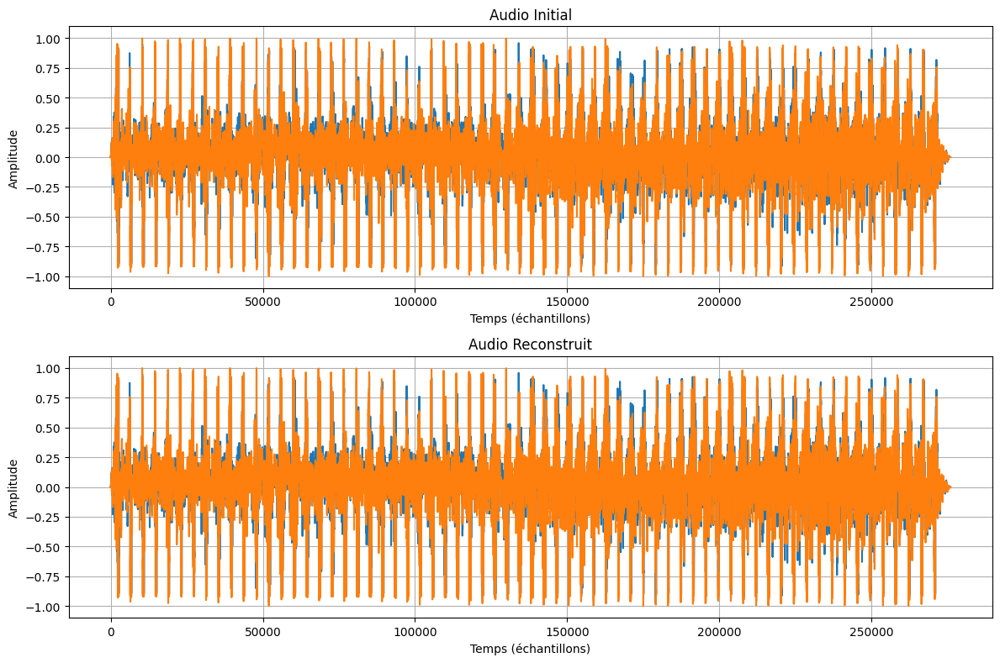

In [54]:
# Charger les fichiers audio
audio1, sr1 = sf.read(path1)
audio2, sr2 = sf.read(path2)

# Créer une figure avec deux sous-graphiques
fig, axs = plt.subplots(2, 1, figsize=(12, 8))

# Afficher le premier fichier audio
axs[0].plot(audio1)
axs[0].set_title('Audio Initial')
axs[0].set_xlabel('Temps (échantillons)')
axs[0].set_ylabel('Amplitude')
axs[0].grid(True)

# Afficher le deuxième fichier audio
axs[1].plot(audio2)
axs[1].set_title('Audio Reconstruit')
axs[1].set_xlabel('Temps (échantillons)')
axs[1].set_ylabel('Amplitude')
axs[1].grid(True)

# Ajuster la mise en page pour éviter que les graphiques ne se chevauchent
plt.tight_layout()

# Afficher la figure
plt.show()